https://www.kaggle.com/datasets/aditya276/face-mask-dataset-yolo-format?resource=download

In [4]:
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cpu

Looking in indexes: https://download.pytorch.org/whl/cpu
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 151.0/151.0 MB 5.6 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 6.6 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 7.8 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 7.8 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 7.1 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.2/133.2 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 170.9/170.9 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 7.2 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 6.9 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 536.2/536.2 kB 6.6 MB/s eta 0:00:00a 0:00:01

[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To 

In [3]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16605, done.
remote: Counting objects: 100% (146/146), done.
remote: Compressing objects: 100% (103/103), done.
remote: Total 16605 (delta 50), reused 96 (delta 43), pack-reused 16459
Receiving objects: 100% (16605/16605), 15.32 MiB | 6.79 MiB/s, done.
Resolving deltas: 100% (11349/11349), done.


In [15]:
!pip install -r yolov5/requirements.txt

  Using cached GitPython-3.1.43-py3-none-any.whl.metadata (13 kB)
  Using cached matplotlib-3.9.0-cp311-cp311-macosx_10_12_x86_64.whl.metadata (11 kB)
  Using cached opencv-python-4.10.0.82.tar.gz (95.1 MB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached pillow-10.3.0-cp311-cp311-macosx_10_10_x86_64.whl.metadata (9.2 kB)
  Using cached PyYAML-6.0.1-cp311-cp311-macosx_10_9_x86_64.whl.metadata (2.1 kB)
  Using cached requests-2.32.3-py3-none-any.whl.metadata (4.6 kB)
  Using cached scipy-1.13.1-cp311-cp311-macosx_10_9_x86_64.whl.metadata (60 kB)
  Using cached thop-0.1.1.post2209072238-py3-none-any.whl.metadata (2.7 kB)
  Using cached tqdm-4.66.4-py3-none-any.whl.metadata (57 kB)
  Using cached ultralytics-8.2.31-py3-none-any.whl.metadata (41 kB)
  Using cached pandas-2.2.2-cp311-cp311-macosx_10_9_x86_64.whl.metadata (19 kB)
  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB

In [26]:
import torch
from matplotlib import pyplot as plt
import numpy as np
import cv2
from PIL import Image
import os
import random

Load Model

In [2]:
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')

Using cache found in /Users/hytung/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-6-14 Python-3.11.5 torch-2.2.2 CPU

100%|██████████| 14.1M/14.1M [00:02<00:00, 7.05MB/s]

Fusing layers... 
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


In [3]:
model

AutoShape(
  (model): DetectMultiBackend(
    (model): DetectionModel(
      (model): Sequential(
        (0): Conv(
          (conv): Conv2d(3, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
          (act): SiLU(inplace=True)
        )
        (1): Conv(
          (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (act): SiLU(inplace=True)
        )
        (2): C3(
          (cv1): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv2): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv3): Conv(
            (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (m): Sequential(
            (0): Bottleneck(
              (cv1): Conv(
                (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
  

Make Detections

In [6]:
img = np.array(Image.open('dataset/train/images/1_3-770x433.png'))

In [7]:
results = model(img)
results.print()

image 1/1: 433x770 11 persons
Speed: 13.5ms pre-process, 275.7ms inference, 17.4ms NMS per image at shape (1, 3, 384, 640)


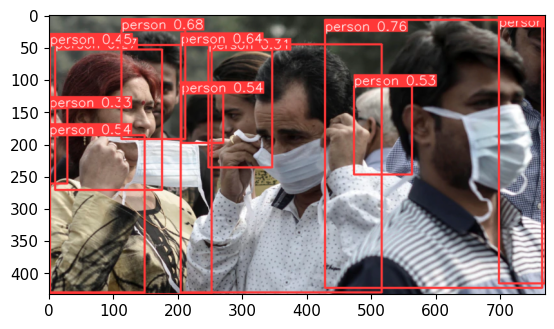

In [8]:
%matplotlib inline 
plt.imshow(np.squeeze(results.render()))
plt.show()

In [9]:
results.render()

[array([[[103, 107,  99],
         [106, 109, 101],
         [110, 114, 106],
         ...,
         [255,  56,  56],
         [255,  56,  56],
         [255,  56,  56]],
 
        [[103, 107,  99],
         [106, 109, 101],
         [110, 114, 106],
         ...,
         [255,  56,  56],
         [255,  56,  56],
         [255,  56,  56]],
 
        [[103, 107,  99],
         [106, 109, 101],
         [110, 114, 106],
         ...,
         [255,  56,  56],
         [255,  56,  56],
         [255,  56,  56]],
 
        ...,
 
        [[255,  56,  56],
         [255,  56,  56],
         [255,  56,  56],
         ...,
         [203, 209, 228],
         [204, 210, 229],
         [204, 210, 229]],
 
        [[255,  56,  56],
         [255,  56,  56],
         [255,  56,  56],
         ...,
         [203, 209, 228],
         [203, 209, 228],
         [202, 208, 227]],
 
        [[255,  56,  56],
         [255,  56,  56],
         [255,  56,  56],
         ...,
         [202, 208, 227],
  

Train Custom Model

In [17]:
!cd yolov5 && python train.py --img 416 --batch 16 --epochs 2 --data classes.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=classes.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=2, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-321-g3742ab49 Python-3.11.5 torch-2.2.2 CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anch

Load Model

In [22]:
model = torch.hub.load('ultralytics/yolov5', 'custom', path='yolov5/runs/train/exp3/weights/last.pt', force_reload=True)

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /Users/hytung/.cache/torch/hub/master.zip
YOLOv5 🚀 2024-6-15 Python-3.11.5 torch-2.2.2 CPU

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


In [23]:
img = np.array(Image.open('dataset/train/images/1_3-770x433.png'))

In [24]:
results = model(img)
results.print()

image 1/1: 433x770 3 masks
Speed: 5.0ms pre-process, 174.0ms inference, 0.6ms NMS per image at shape (1, 3, 384, 640)


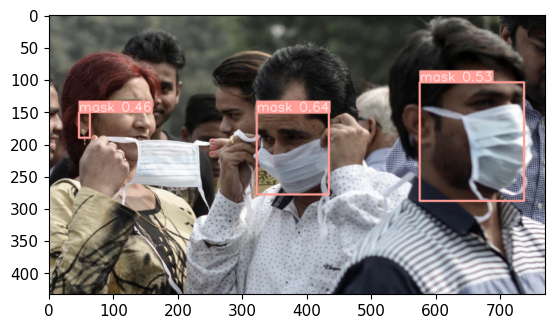

In [25]:
%matplotlib inline 
plt.imshow(np.squeeze(results.render()))
plt.show()

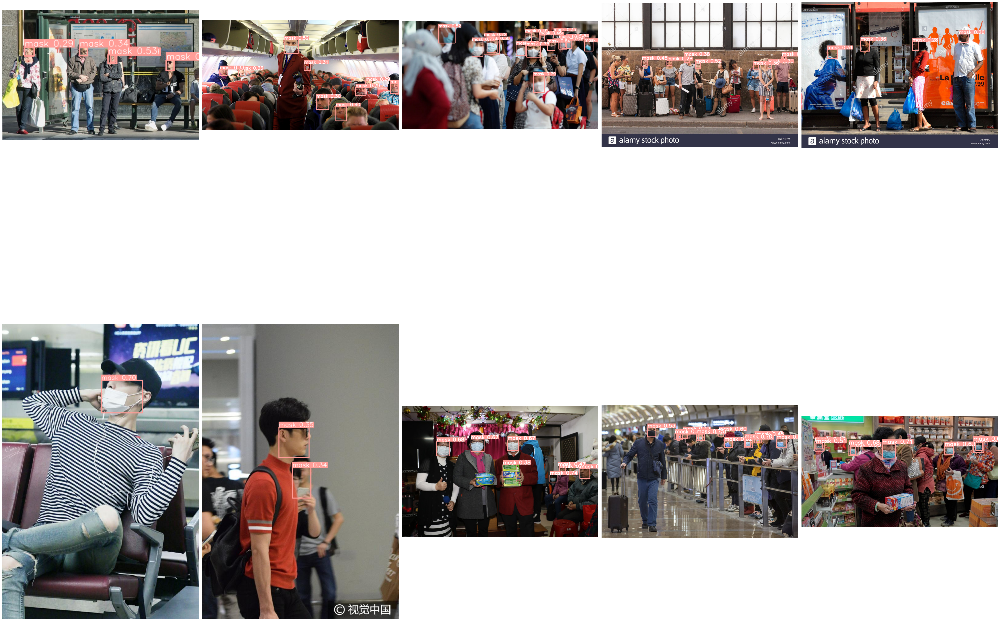

In [33]:
image_dir = 'dataset/test/images'

image_files = [os.path.join(image_dir, img) for img in os.listdir(image_dir) if img.endswith(('.png', '.jpg', '.jpeg'))]

random_images = random.sample(image_files, 10)

def show_images_with_predictions(model, images, cols=5):
    rows = len(images) // cols + int(len(images) % cols != 0)
    fig, axes = plt.subplots(rows, cols, figsize=(50, 50))
    for ax, img_path in zip(axes.flatten(), images):
        img = Image.open(img_path)
        results = model(img)
        results.render()  # Render results on the image
        img_with_boxes = Image.fromarray(results.ims[0])
        ax.imshow(img_with_boxes)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

show_images_with_predictions(model, random_images)

Real Time Detection

In [24]:
cap = cv2.VideoCapture(0)
while cap.isOpened():
    ret, frame = cap.read()
    
    # Make detections 
    results = model(frame)
    
    cv2.imshow('YOLO', np.squeeze(results.render()))
    
    if cv2.waitKey(10) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()